<a href="https://colab.research.google.com/github/scdivad/CS521/blob/main/CS521_HW_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup and boilerplate

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/CS521

/content/drive/MyDrive/CS521


In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
from skimage import io, segmentation, color
import json
import os
import numpy as np
import matplotlib.pyplot as plt


In [4]:
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'
device

'cuda'

In [5]:
# Load the pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
model.eval()  # Set model to evaluation mode
model.to(device)

# Define the image preprocessing transformations
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Load the ImageNet class index mapping
with open("imagenet_class_index.json") as f:
    class_idx = json.load(f)
idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]
idx2synset = [class_idx[str(k)][0] for k in range(len(class_idx))]
id2label = {v[0]: v[1] for v in class_idx.values()}

imagenet_path = './imagenet_samples'

# List of image file paths
image_paths = os.listdir(imagenet_path)

for img_path in image_paths:
    my_img = imagenet_path + '/' + img_path

    # Open and preprocess the image
    input_image = Image.open(my_img).convert('RGB')
    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0)  # Create a mini-batch as expected by the model

    # Move the input and model to GPU if available
    if torch.cuda.is_available():
        input_batch = input_batch.to('cuda')
        model.to('cuda')

    # Perform inference
    with torch.no_grad():
        print(input_batch.shape)
        output = model(input_batch)
        print(output.shape)

    # Get the predicted class index
    _, predicted_idx = torch.max(output, 1)
    predicted_idx = predicted_idx.item()
    predicted_synset = idx2synset[predicted_idx]
    predicted_label = idx2label[predicted_idx]

    print(f"Predicted label: {predicted_synset} ({predicted_label})")


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 215MB/s]


torch.Size([1, 3, 224, 224])
torch.Size([1, 1000])
Predicted label: n01806143 (peacock)
torch.Size([1, 3, 224, 224])
torch.Size([1, 1000])
Predicted label: n04118776 (rule)
torch.Size([1, 3, 224, 224])
torch.Size([1, 1000])
Predicted label: n03250847 (drumstick)
torch.Size([1, 3, 224, 224])
torch.Size([1, 1000])
Predicted label: n03792782 (mountain_bike)
torch.Size([1, 3, 224, 224])
torch.Size([1, 1000])
Predicted label: n03938244 (pillow)


In [6]:
img_name_list = ['mountain_bike.JPEG', 'mousetrap.JPEG',  'paintbrush.JPEG',  'peacock.JPEG',  'piggy_bank.JPEG']

# Q1 LIME

# Helper Functions

In [7]:
def get_superpixel_segmentation(model, input_batch, n_segments, compactness, plot=True):
    image = input_batch.squeeze(0).permute(1, 2, 0).cpu().numpy()
    segments = segmentation.slic(image, n_segments=n_segments, compactness=compactness, start_label=0)
    n_segments = np.max(segments).item() + 1 # true number of segments sometimes can be slightly off from original

    if plot:
        segmented_image = color.label2rgb(segments, image, kind='avg')
        plt.figure(figsize=(8, 8))
        plt.imshow(segmented_image)
        plt.axis('off')
        plt.title("Superpixel Segmented Image")
        plt.show()

    height, width, _ = segmented_image.shape
    segment_id_to_indices = [([],[]) for _ in range(n_segments)]
    for i in range(height):
        for j in range(width):
            segment_id_to_indices[segments[i][j]][0].append(i)
            segment_id_to_indices[segments[i][j]][1].append(j)
    for i in range(n_segments):
        segment_id_to_indices[i] = (torch.tensor(segment_id_to_indices[i][0]), torch.tensor(segment_id_to_indices[i][1]))
    return segment_id_to_indices


In [8]:
# makes image segments turn gray based off what is in active_segments
def mask_image(image, active_segments, segment_id_to_indices):
    masked_image = image.clone()
    for s in range(len(segment_id_to_indices)):
        if s not in active_segments:
            masked_image[..., segment_id_to_indices[s][0], segment_id_to_indices[s][1]] = 127/255. # grayscale
    return masked_image

In [9]:
def kernel(d, width=0):
    if width == 0:
        width = d.max() / 2
    return torch.exp(-(d ** 2) / (width ** 2))

In [10]:
from sklearn.linear_model import lars_path

def select_K_features(input_batch, X_train, Y_train, pi_z_train, K):
    X_train_np = X_train.cpu().numpy()
    Y_train_np = Y_train.cpu().numpy()
    pi_z_train_np = pi_z_train.cpu().numpy()

    # Feature Selection using LARS (Lasso path) from LIME codebase
    alphas, active, coefs = lars_path(X_train_np, Y_train_np, method='lasso')
    for i in range(len(coefs.T) - 1, -1, -1):
        nonzero = np.nonzero(coefs[:, i])[0]
        if len(nonzero) <= K:
            break
    selected_K_features = nonzero
    return selected_K_features


In [11]:
def get_Z_set(input_batch, N, segment_id_to_indices):
    n_segments = len(segment_id_to_indices)
    z_prime = torch.from_numpy(np.random.binomial(1, 0.50, size=(N, n_segments)))

    # get f(z) for labels of the explanation linear model
    z = []
    for i in range(N):
        active = {j for j in range(z_prime.shape[1]) if z_prime[i, j]}
        z.append(mask_image(input_batch, active, segment_id_to_indices).squeeze(0))
    z = torch.stack(z)
    batch_size = 64 # small batches due to cuda memory issues
    f_z_list = []
    for i in range(0, len(z), batch_size):
        z_batch = z[i:i + batch_size]
        f_z_batch = model(z_batch).clone().detach()
        f_z_list.append(f_z_batch)
    f_z = torch.cat(f_z_list, dim=0)

    # get pi(z)
    distances_l2 = torch.norm(z.view((N, -1)) - input_batch.view((1, -1)), dim=-1, p=2)
    pi_z = kernel(distances_l2)

    return z_prime, f_z, pi_z

In [12]:
class BinaryLogisticRegression(nn.Module):
    def __init__(self, input_dim):
        super(BinaryLogisticRegression, self).__init__()
        self.linear = nn.Linear(input_dim, 1, bias=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        return self.sigmoid(self.linear(x))

def train_main_classifier(logistic_model, X, y, pi, K, num_epochs=25000*4):
    K = y.shape[0]
    optimizer = optim.SGD(logistic_model.parameters(), lr=0.01)

    criterion = nn.BCELoss(reduction='none')
    for epoch in range(num_epochs):
        logistic_model.train()
        optimizer.zero_grad()
        outputs = logistic_model(X).squeeze().to(device)
        bce_loss = criterion(outputs, y)
        weighted_bce_loss = torch.sum(bce_loss * pi) / K + 0.01 * logistic_model.linear.weight.norm(p=2)
        weighted_bce_loss.backward()
        optimizer.step()
        if (epoch + 1) % (num_epochs // 10) == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {weighted_bce_loss.item():.4f}')


In [13]:
def test_explanation_classifier(logistic_model, X, y, pi):
    logistic_model.eval()

    with torch.no_grad():
        outputs_test = logistic_model(X).squeeze()
        predictions_test = (outputs_test >= 0.5).float()
        correct_predictions = (predictions_test == y).float()
        accuracy_test = torch.sum(correct_predictions * pi) / torch.sum(pi)
        print(f'Test Accuracy: {accuracy_test.item():.4f}')

In [14]:
def show_explanation(weights, selected_features, segment_id_to_indices): # make input be weights instead of linear model
    weights = weights.flatten()
    feature_weights = list(zip(selected_features, weights))
    positive_features = {idx for idx, weight in feature_weights if weight > 0}
    lime_expl = mask_image(input_batch, positive_features, segment_id_to_indices).cpu()

    plt.imshow(lime_expl.squeeze(0).permute(1, 2, 0))
    plt.axis('off')
    plt.title("LIME Explanation: Positive Contribution Features")
    plt.show()


# Main and Results

In [15]:
def show_LIME_explanation(model, input_batch, n_segments, compactness, N, K, num_epochs):
    segment_id_to_indices = get_superpixel_segmentation(model, input_batch, n_segments=n_segments, compactness=compactness)
    n_segments = len(segment_id_to_indices)
    z_prime, f_z, pi_z = get_Z_set(input_batch, N, segment_id_to_indices)

    # set up training data
    c = model(input_batch).argmax().item()
    X = z_prime.to(torch.float)
    decisions_f_z = f_z.argmax(dim=-1)
    Y = torch.where(decisions_f_z == c, +1.0, 0.0) # I am using logistic regression, so labels are 0,1 instead of -1,+1
    print("number of samples on either side of decision boundary should be about the same: ", (Y==1).sum(), (Y==0).sum())
    num_train = int(0.8 * len(X))
    X_train = X[:num_train]
    y_train = Y[:num_train]
    pi_z_train = pi_z[:num_train]
    X_test = X[num_train:]
    y_test = Y[num_train:]
    pi_z_test = pi_z[num_train:]

    selected_K = select_K_features(input_batch, X_train, y_train, pi_z_train, K)
    print(f'Selected features (indices): {selected_K}')
    print("Image of K available features")
    selected_K_img = mask_image(input_batch, selected_K, segment_id_to_indices).cpu()
    plt.imshow(selected_K_img.squeeze(0).permute(1, 2, 0))
    plt.axis('off')
    plt.show()

    X_train_K = X_train[:, selected_K].to(device)
    X_test_K = X_test[:, selected_K].to(device)
    K = len(selected_K) # might be less than real K

    logistic_model = BinaryLogisticRegression(K).to(device)

    train_main_classifier(logistic_model, X_train_K, y_train, pi_z_train, K, num_epochs)
    test_explanation_classifier(logistic_model, X_test_K, y_test, pi_z_test)

    w = logistic_model.linear.weight.detach().flatten()

    print("Final Explanation")
    show_explanation(w, selected_K, segment_id_to_indices)

    # return ranked pixels of image shape to compare with SmoothGrad
    feature_weights = torch.tensor([selected_K, w]).T
    tmp = torch.argsort(feature_weights[:,1], dim=0, descending=True)
    rank = torch.empty_like(tmp)
    rank[tmp] = torch.arange(len(tmp))

    height, width = input_batch.shape[2], input_batch.shape[3]
    ret = torch.ones((height, width), dtype=torch.long) * K
    for i, id in enumerate(selected_K):
        ret[segment_id_to_indices[id][0], segment_id_to_indices[id][1]] = rank[i]

    return ret




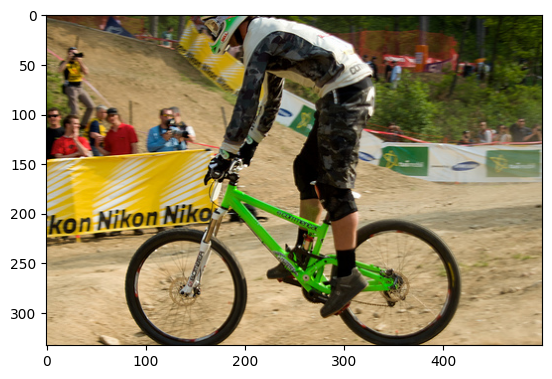

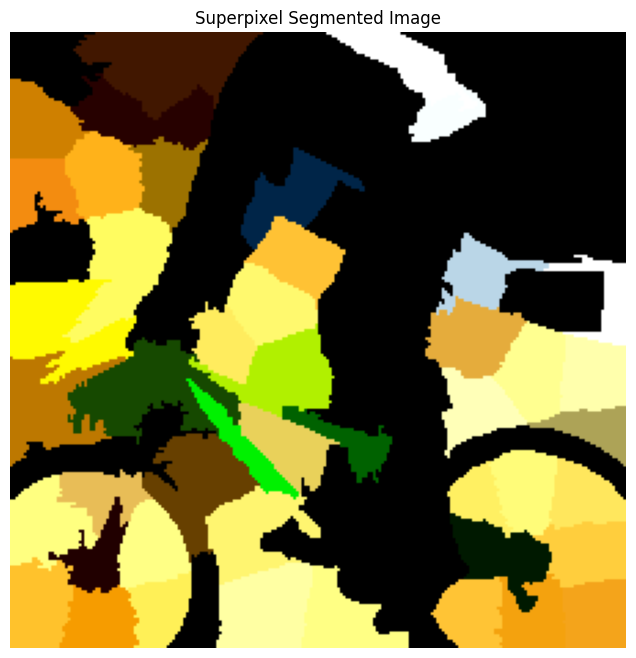

number of samples on either side of decision boundary should be about the same:  tensor(135, device='cuda:0') tensor(865, device='cuda:0')
Selected features (indices): [17 27 28 29 31 38 41 42 47 50 52 58 59 60 61 66 69 75 76 79]
Image of K available features


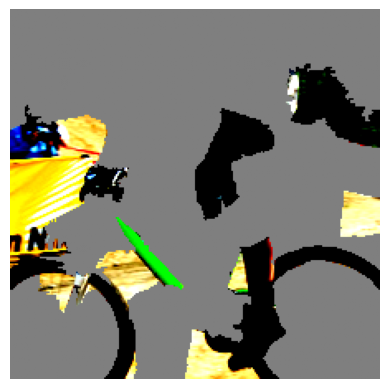

Epoch [100/1000], Loss: 0.0581
Epoch [200/1000], Loss: 0.0542
Epoch [300/1000], Loss: 0.0511
Epoch [400/1000], Loss: 0.0487
Epoch [500/1000], Loss: 0.0468
Epoch [600/1000], Loss: 0.0453
Epoch [700/1000], Loss: 0.0440
Epoch [800/1000], Loss: 0.0430


Epoch [900/1000], Loss: 0.0422
Epoch [1000/1000], Loss: 0.0415
Test Accuracy: 0.8536
Final Explanation


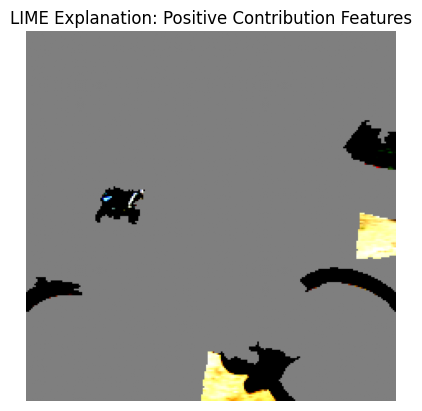

In [75]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[0]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

# input is not actually a batch, just respecting boilerplate code
bike_lime_rank = show_LIME_explanation(model, input_batch, n_segments=100, compactness=20, N=1000, K=20, num_epochs=1000)


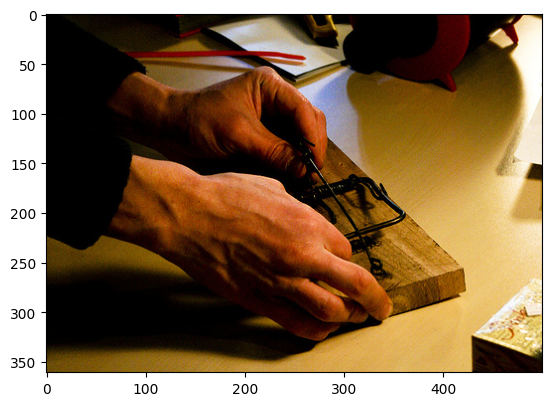

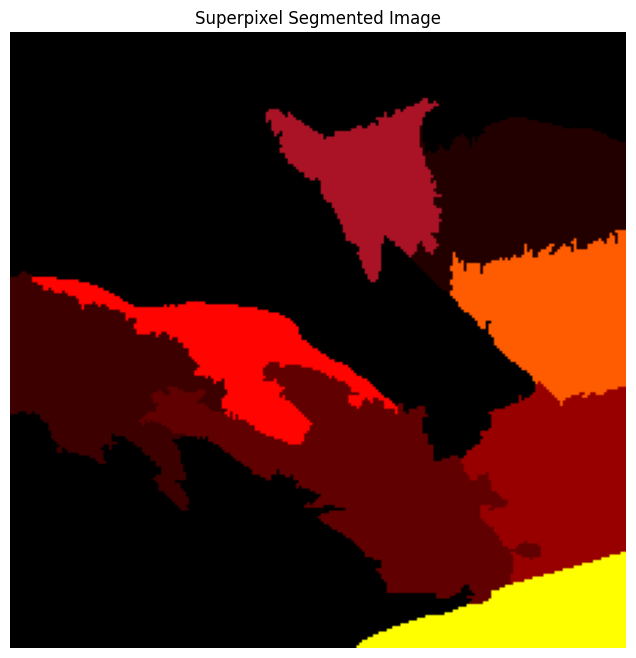

number of samples on either side of decision boundary should be about the same:  tensor(7, device='cuda:0') tensor(993, device='cuda:0')
Selected features (indices): [ 0  3  5  6 12]
Image of K available features


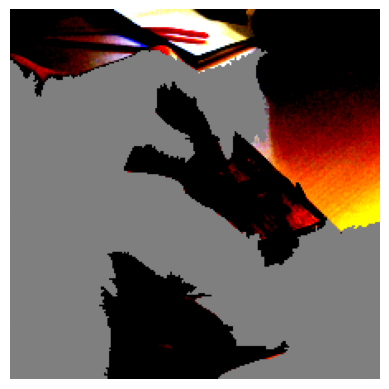

Epoch [100/1000], Loss: 0.0790
Epoch [200/1000], Loss: 0.0730
Epoch [300/1000], Loss: 0.0682
Epoch [400/1000], Loss: 0.0643
Epoch [500/1000], Loss: 0.0611
Epoch [600/1000], Loss: 0.0584
Epoch [700/1000], Loss: 0.0561
Epoch [800/1000], Loss: 0.0541


Epoch [900/1000], Loss: 0.0525
Epoch [1000/1000], Loss: 0.0510
Test Accuracy: 1.0000
Final Explanation


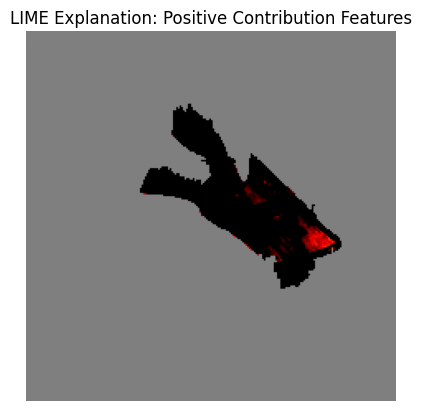

In [77]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[1]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

# input_batch is not actually a batch, just respecting boilerplate code
mousetrap_lime_rank = show_LIME_explanation(model, input_batch, n_segments=30, compactness=10, K=5, N=1000, num_epochs=1000)

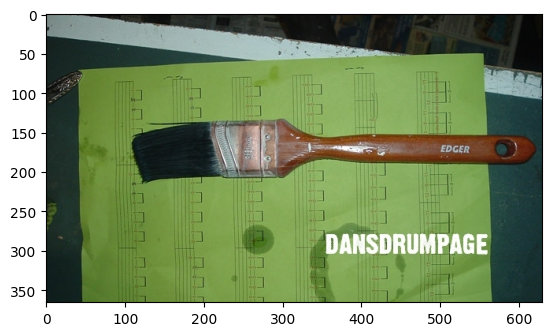

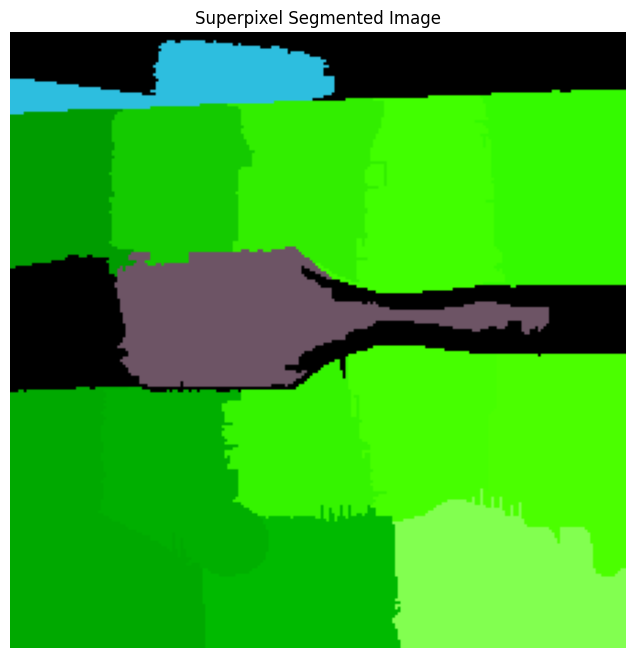

number of samples on either side of decision boundary should be about the same:  tensor(577, device='cuda:0') tensor(423, device='cuda:0')
Selected features (indices): [ 2  3  4  6  7 15]
Image of K available features


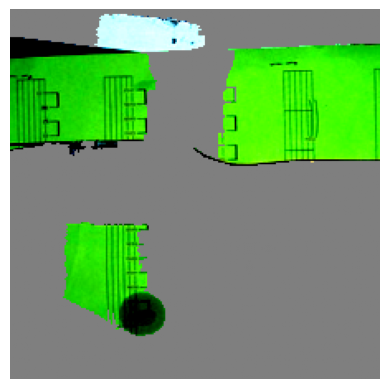

Epoch [100/1000], Loss: 0.1109
Epoch [200/1000], Loss: 0.1101
Epoch [300/1000], Loss: 0.1094
Epoch [400/1000], Loss: 0.1088
Epoch [500/1000], Loss: 0.1082
Epoch [600/1000], Loss: 0.1078
Epoch [700/1000], Loss: 0.1074
Epoch [800/1000], Loss: 0.1071
Epoch [900/1000], Loss: 0.1068


Epoch [1000/1000], Loss: 0.1066
Test Accuracy: 0.5126
Final Explanation


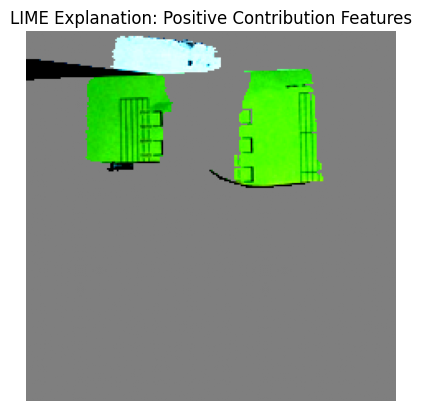

In [78]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[2]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

# input_batch is not actually a batch, just respecting boilerplate code
paintbrush_lime_rank = show_LIME_explanation(model, input_batch, n_segments=30, compactness=10, N=1000, K=6, num_epochs=1000)

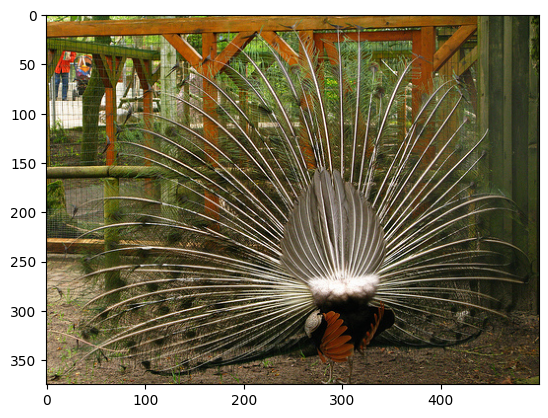

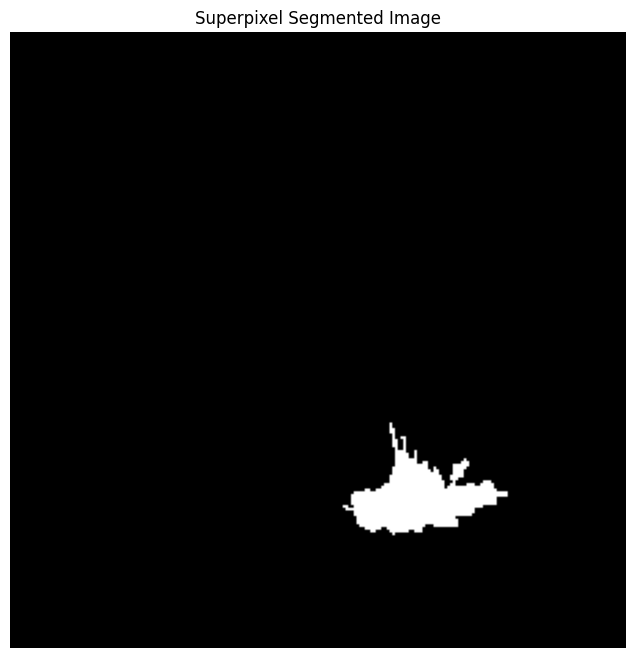

number of samples on either side of decision boundary should be about the same:  tensor(644, device='cuda:0') tensor(356, device='cuda:0')
Selected features (indices): [ 0  1  2  4  5  6  7  9 10 11]
Image of K available features


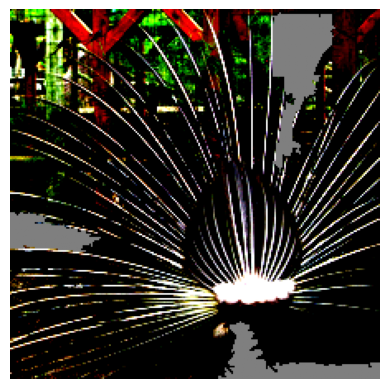

Epoch [100/1000], Loss: 0.1162
Epoch [200/1000], Loss: 0.1046
Epoch [300/1000], Loss: 0.0967
Epoch [400/1000], Loss: 0.0912
Epoch [500/1000], Loss: 0.0873
Epoch [600/1000], Loss: 0.0844
Epoch [700/1000], Loss: 0.0823
Epoch [800/1000], Loss: 0.0806


Epoch [900/1000], Loss: 0.0794
Epoch [1000/1000], Loss: 0.0784
Test Accuracy: 0.8068
Final Explanation


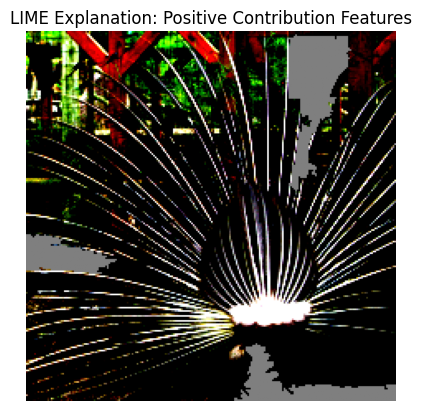

In [79]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[3]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

# input_batch is not actually a batch, just respecting boilerplate code
peacock_lime_rank = show_LIME_explanation(model, input_batch, n_segments=50, compactness=10, N=1000, K=10, num_epochs=1000)


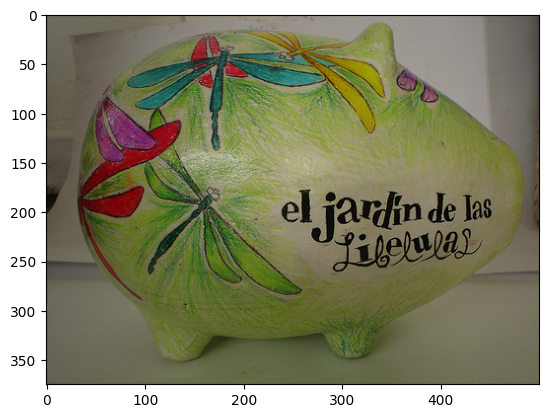

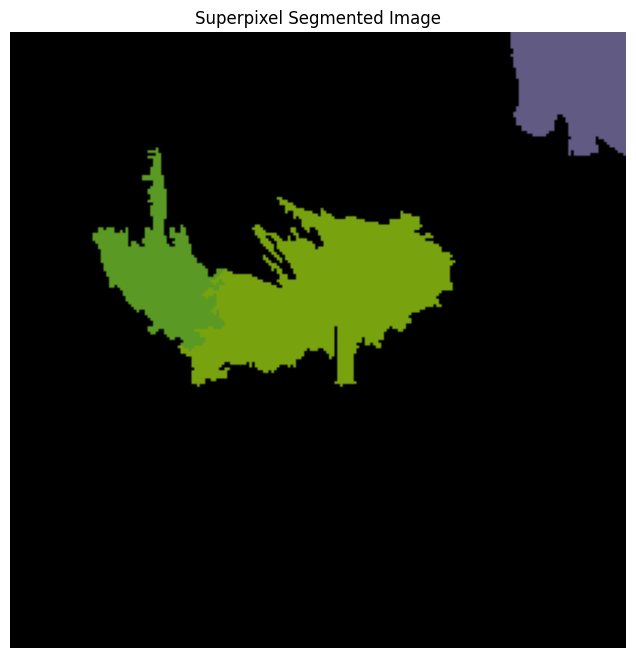

number of samples on either side of decision boundary should be about the same:  tensor(101, device='cuda:0') tensor(899, device='cuda:0')
Selected features (indices): [ 0  2  3  4  5  6  8  9 10 11]
Image of K available features


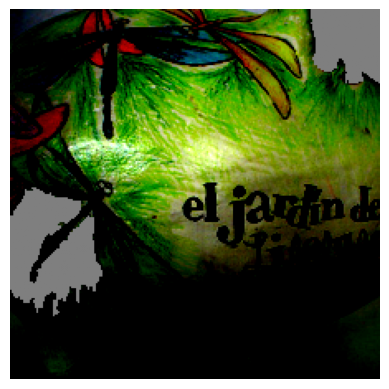

Epoch [100/1000], Loss: 0.0996
Epoch [200/1000], Loss: 0.0990
Epoch [300/1000], Loss: 0.0984
Epoch [400/1000], Loss: 0.0979
Epoch [500/1000], Loss: 0.0975
Epoch [600/1000], Loss: 0.0971
Epoch [700/1000], Loss: 0.0966
Epoch [800/1000], Loss: 0.0963
Epoch [900/1000], Loss: 0.0959
Epoch [1000/1000], Loss: 0.0955


Test Accuracy: 0.7016
Final Explanation


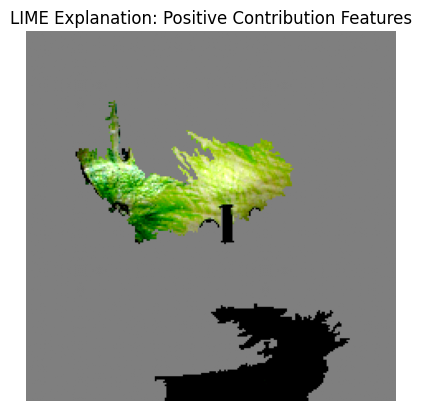

In [80]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[4]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

# input_batch is not actually a batch, just respecting boilerplate code
piggybank_lime_rank = show_LIME_explanation(model, input_batch, n_segments=30, compactness=10, N=1000, K=10, num_epochs=1000)

# Q2 SmoothGrad

In [23]:
def simple_gradient_sensitivity_map(model, input_batch, c, num_samples, plot=False):
    noise = torch.randn(num_samples, *input_batch.shape[1:]).to(device)
    noisy_images = input_batch.repeat(num_samples, 1, 1, 1) + noise
    noisy_images = noisy_images.clone().detach()
    noisy_images.requires_grad = True
    noisy_image_outputs = model(noisy_images)[:,c]
    dummy_loss = noisy_image_outputs.sum()
    dummy_loss.backward()
    grad_abs = noisy_images.grad.abs().mean(dim=0)

    sensitivity_map = (grad_abs - grad_abs.min()) / (grad_abs.max() - grad_abs.min())
    if plot:
        plt.imshow(sensitivity_map.squeeze(0).permute(1, 2, 0).cpu())
        plt.axis('off')
        plt.show()
    return sensitivity_map

In [24]:
import copy
model_softplus = copy.deepcopy(model).to(device)
model_softplus.eval()

# source: https://discuss.pytorch.org/t/how-to-replace-all-relu-activations-in-a-pretrained-network/31591/7
def convert_relu_to_softplus(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.ReLU):
            setattr(model, child_name, nn.Softplus())
        else:
            convert_relu_to_softplus(child)
convert_relu_to_softplus(model_softplus)


It can be shown that $\nabla_x D(x, x+\delta) = 2H(f_c(x) - f_c(x + \delta))  \nabla_x (f_c(x) - f_c(x + \delta)).$

In [126]:
import torch.nn.functional as F

def fgsm(model, x_orig, x, y, c, eps):
    def mse_hess(x):
        return model(x_orig)[:,c] - model(x)[:,c]
    def ce(x):
        return F.cross_entropy(y, model(x))

    model.eval()

    x = x.clone().detach()
    x.requires_grad = True
    grad_x = torch.autograd.grad(mse_hess(x), x, retain_graph=True)[0]
    _, grad_mse = torch.autograd.functional.hvp(mse_hess, x, grad_x, strict=True)
    grad_mse = 2 * grad_mse
    grad_ce = torch.autograd.grad(ce(x), x)[0]
    adv_x = x + 0.5 * grad_mse.sign() - 0.5 * grad_ce.sign()
    adv_x = torch.clamp(adv_x, 0, 1)

    return adv_x.clone().detach()

def pgd_untargeted(model, x, c, k, eps):
    model.eval()
    orig_x = x.clone().detach()

    y = model(x).clone().detach() # y is no longer the one hot true label
    lb = torch.clamp(x - eps, 0, 1)
    ub = torch.clamp(x + eps, 0, 1)

    x = orig_x.clone().detach()
    x = torch.clamp(x, 0, 1)
    candidates = []
    for i in range(k):
        x = fgsm(model, orig_x, x, y, c, eps)
        x = torch.clamp(x, lb, ub)
        candidates.append(x.clone().detach())

    ret = candidates[0]
    max_diff = 0
    for candidate in candidates:
        if model(candidate).argmax() == model(ret).argmax():
            diff = torch.norm(simple_gradient_sensitivity_map(model, candidate, c, 50) - simple_gradient_sensitivity_map(model, orig_x, c, 50), p=2)
            if diff > torch.norm(simple_gradient_sensitivity_map(model, ret, c, 50) - simple_gradient_sensitivity_map(model, orig_x, c, 50), p=2):
                ret = candidate
                max_diff = diff
    print("max mse diff: ", max_diff/x.numel())
    return ret

# Main and Results

In [127]:
def show_smoothgrad_explanation(model, input_batch):
    input_batch = input_batch.clone().detach().to(device)
    plt.imshow(input_batch.squeeze(0).permute(1, 2, 0).cpu())
    plt.axis('off')
    plt.show()

    c = model(input_batch).argmax().item()
    orig_sensitivity = simple_gradient_sensitivity_map(model, input_batch, c, 50, plot=True)

    for eps in [2/255., 4/255., 8/255.]:
        adex = pgd_untargeted(model_softplus, input_batch, c, 5, eps)
        print("labels (should be same): ", idx2label[model(input_batch).argmax().cpu()], idx2label[model(adex).argmax().cpu()])
        adv_sensitivity = simple_gradient_sensitivity_map(model, adex, c, 50, plot=True)

    # return rank for comparison
    flat_tensor = orig_sensitivity.sum(dim=0).flatten().to(device)
    sorted_indices = torch.argsort(flat_tensor).to(device)
    ranks = torch.empty_like(sorted_indices).to(device)
    ranks[sorted_indices] = torch.arange(len(flat_tensor)).to(device)
    return ranks.view(*orig_sensitivity.shape[1:]) # summed over channels

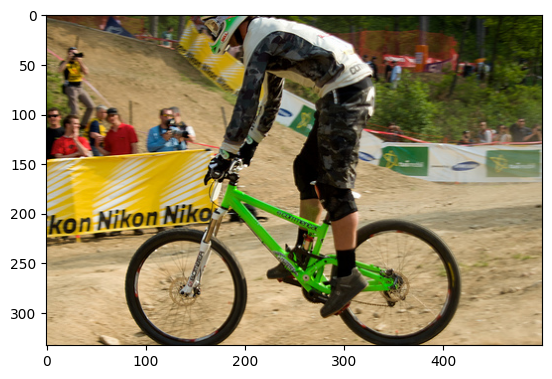

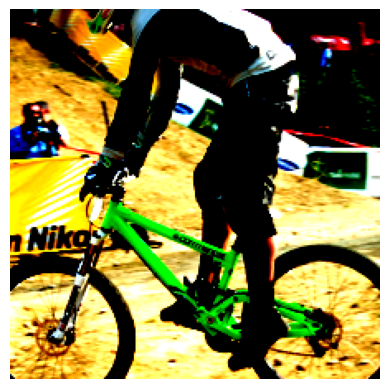

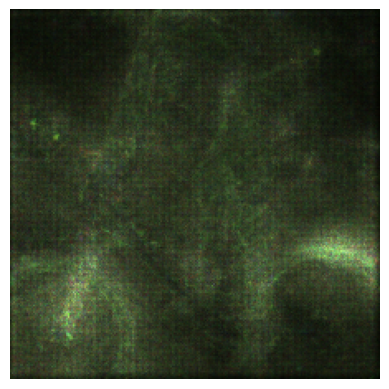

max mse diff:  tensor(0.0002, device='cuda:0')
labels (should be same):  mountain_bike mountain_bike


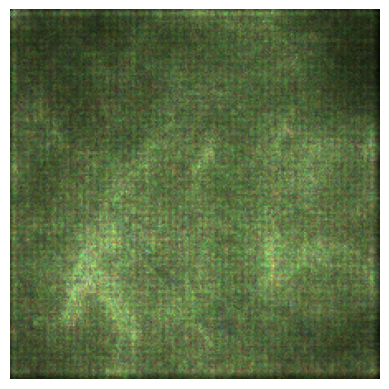

max mse diff:  tensor(0.0001, device='cuda:0')
labels (should be same):  mountain_bike mountain_bike


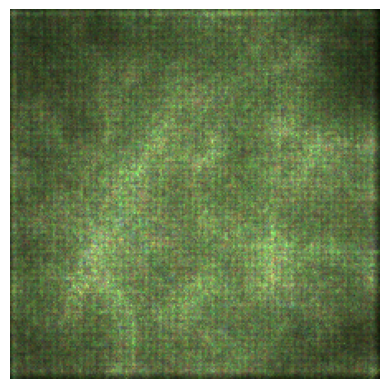

max mse diff:  tensor(0.0002, device='cuda:0')
labels (should be same):  mountain_bike mountain_bike


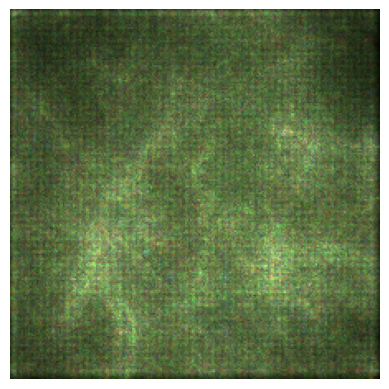

In [128]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[0]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

bike_smoothgrad_rank = show_smoothgrad_explanation(model, input_batch)

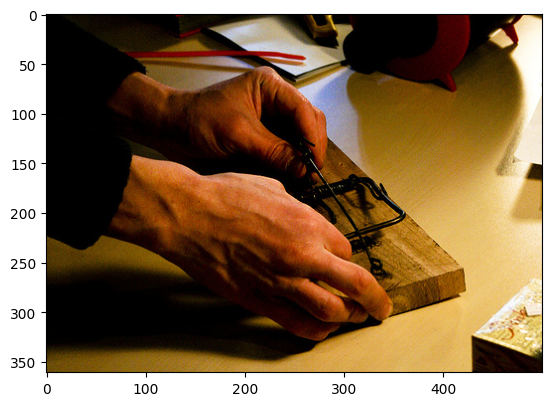

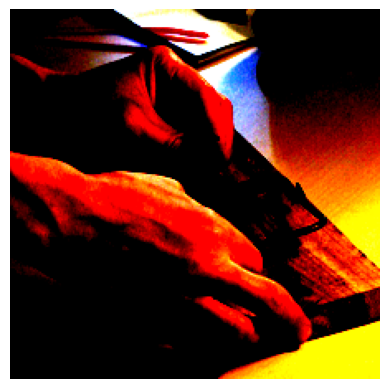

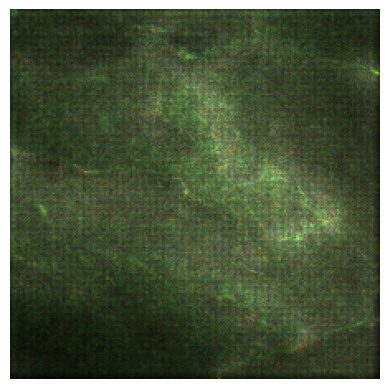

max mse diff:  tensor(0.0002, device='cuda:0')
labels (should be same):  drumstick goldfish


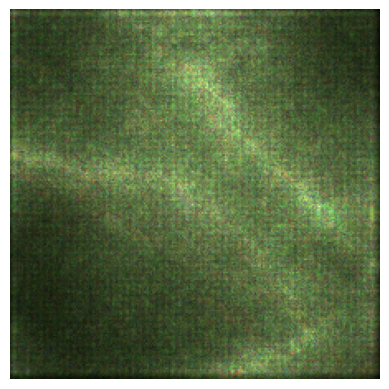

max mse diff:  tensor(0.0002, device='cuda:0')
labels (should be same):  drumstick goldfish


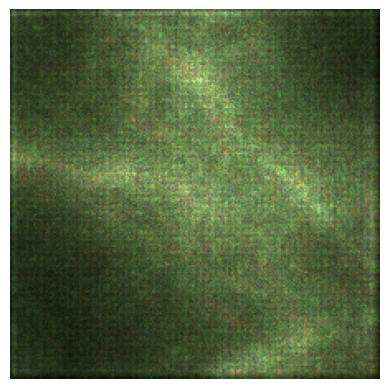

max mse diff:  0.0
labels (should be same):  drumstick goldfish


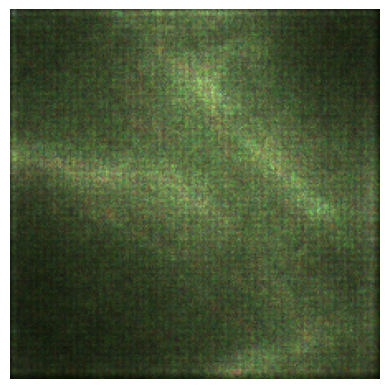

In [129]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[1]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

mousetrap_smoothgrad_rank =show_smoothgrad_explanation(model, input_batch)

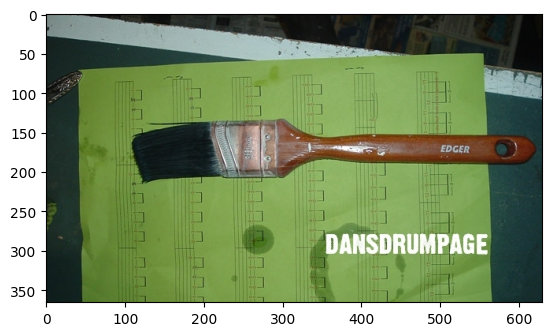

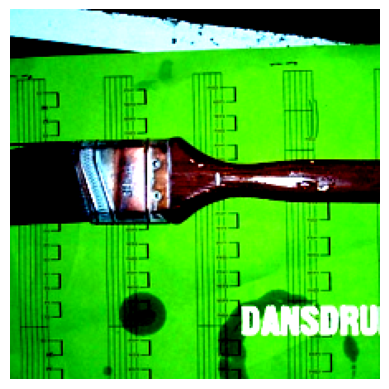

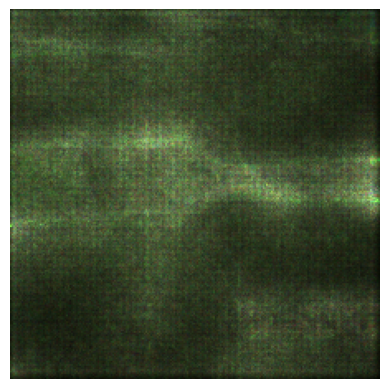

max mse diff:  tensor(6.8977e-05, device='cuda:0')
labels (should be same):  rule slide_rule


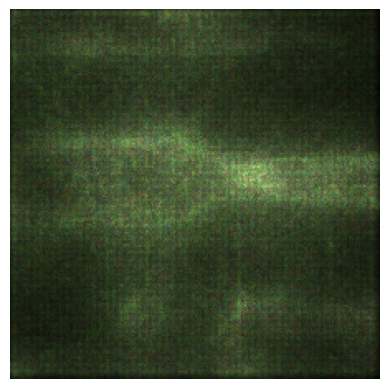

max mse diff:  tensor(8.0686e-05, device='cuda:0')
labels (should be same):  rule slide_rule


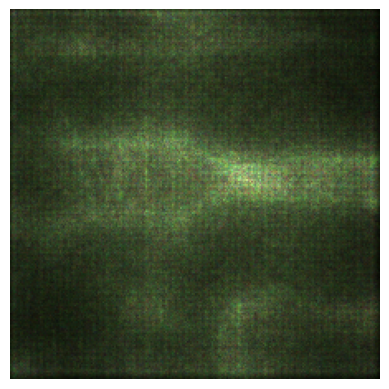

max mse diff:  0.0
labels (should be same):  rule slide_rule


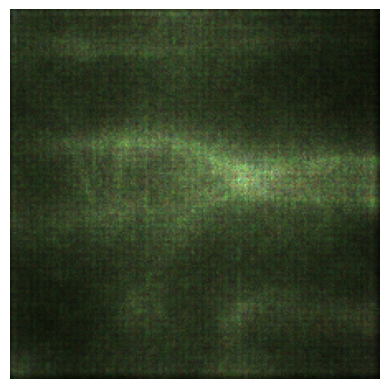

In [130]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[2]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

paintbrush_smoothgrad_rank = show_smoothgrad_explanation(model, input_batch)

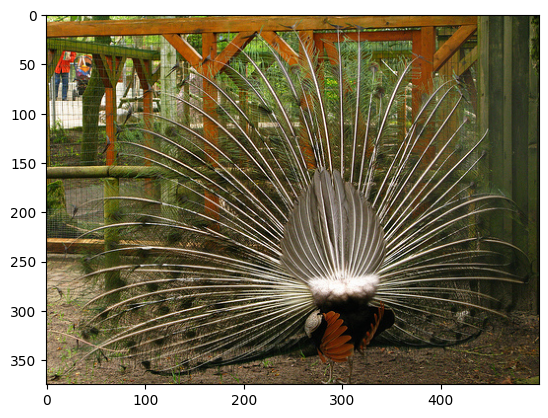

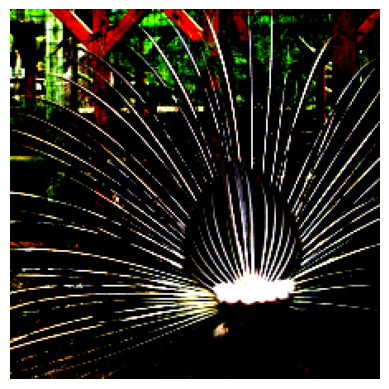

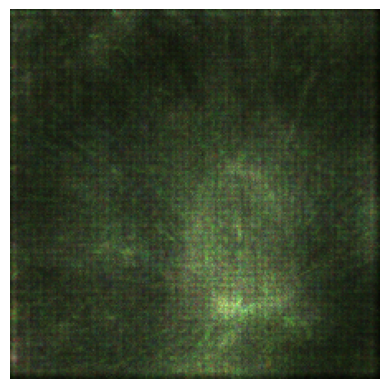

max mse diff:  tensor(0.0002, device='cuda:0')
labels (should be same):  peacock peacock


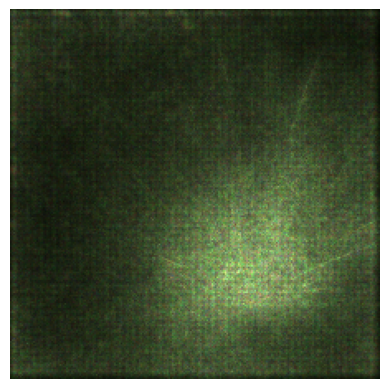

max mse diff:  tensor(0.0002, device='cuda:0')
labels (should be same):  peacock peacock


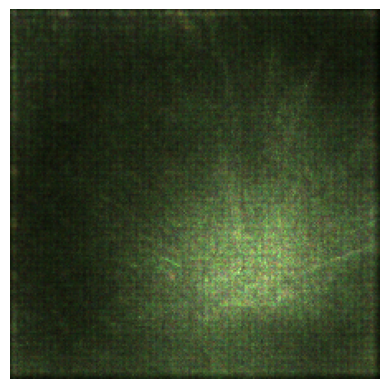

max mse diff:  tensor(0.0001, device='cuda:0')
labels (should be same):  peacock peacock


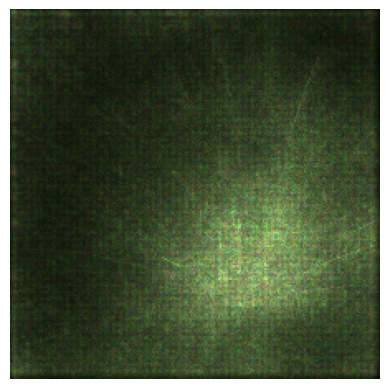

In [131]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[3]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

peacock_smoothgrad_rank = show_smoothgrad_explanation(model, input_batch)

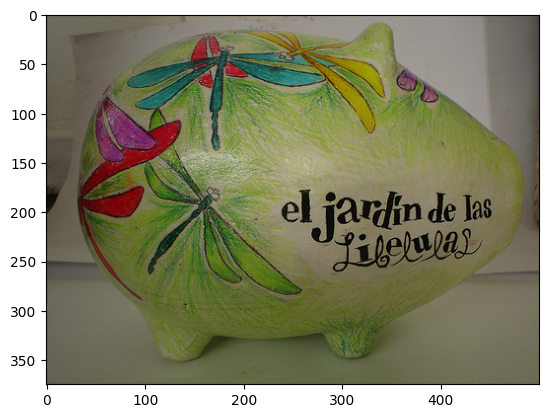

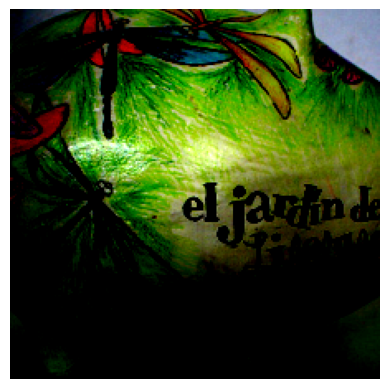

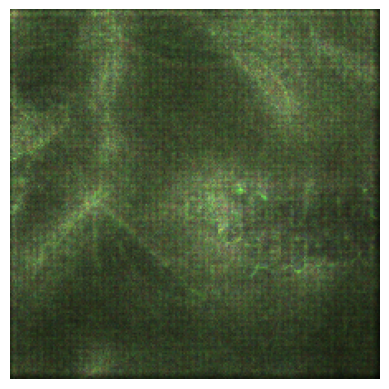

max mse diff:  tensor(0.0004, device='cuda:0')
labels (should be same):  pillow book_jacket


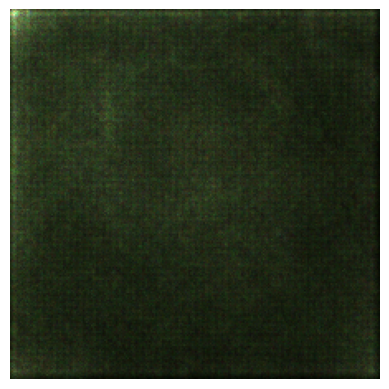

max mse diff:  tensor(0.0003, device='cuda:0')
labels (should be same):  pillow book_jacket


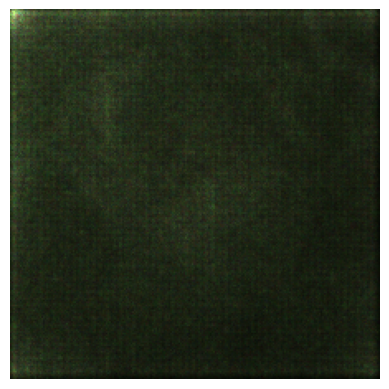

max mse diff:  tensor(0.0003, device='cuda:0')
labels (should be same):  pillow book_jacket


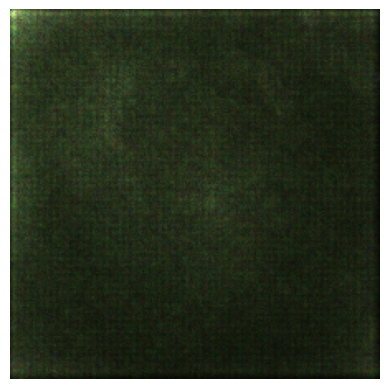

In [132]:
input_image = Image.open(f'./imagenet_samples/{img_name_list[4]}').convert('RGB')
input_batch = preprocess(input_image).unsqueeze(0).to(device)
plt.imshow(input_image)
plt.show()

piggybank_smoothgrad_rank = show_smoothgrad_explanation(model, input_batch)

In [133]:
def compare_ranks(x, y):
    x = x.flatten()
    y = y.flatten()
    n = x.numel()
    spearman = 1 - (6 * torch.sum((x-y)**2) / (n * (n**2 - 1)))
    indices = torch.triu_indices(n, n, offset=1)
    x_sign = torch.sign(x[indices[0]] - x[indices[1]])
    y_sign = torch.sign(y[indices[0]] - y[indices[1]])
    c = (x_sign * y_sign > 0).sum()
    d = (x_sign * y_sign < 0).sum()
    kendall = 2 * (c - d) / (n * (n - 1))
    return spearman, kendall


In [134]:
print("spearman, kendall")
print(compare_ranks(bike_smoothgrad_rank.to(device), bike_lime_rank.to(device)))
print(compare_ranks(mousetrap_smoothgrad_rank.to(device), mousetrap_lime_rank.to(device)))
print(compare_ranks(paintbrush_smoothgrad_rank.to(device), paintbrush_lime_rank.to(device)))
print(compare_ranks(peacock_smoothgrad_rank.to(device), peacock_lime_rank.to(device)))
print(compare_ranks(piggybank_smoothgrad_rank.to(device), piggybank_lime_rank.to(device)))


spearman, kendall
(tensor(-0.9963, device='cuda:0'), tensor(-0.0886, device='cuda:0'))
(tensor(-0.9992, device='cuda:0'), tensor(0.0016, device='cuda:0'))
(tensor(-0.9988, device='cuda:0'), tensor(0.0286, device='cuda:0'))
(tensor(-0.9992, device='cuda:0'), tensor(-0.0657, device='cuda:0'))
(tensor(-0.9991, device='cuda:0'), tensor(0.1090, device='cuda:0'))
